In [20]:
import csv
import pandas as pd
import geopandas as gpd
import json    
import requests
import pprint
pp = pprint.PrettyPrinter
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline
from shapely.geometry import Point
from matplotlib import pyplot as plt
import requests
import shapefile
import plotly.express as px
import plotly

In [21]:
place = pd.read_csv('data/place_us.csv')
pl1=place[place['opened_on'].notnull()]
pl2=place[place['closed_on'].notnull()]
pl1['year']=pl1['opened_on'].str.split('/').str[-1]
pl1['month']=pl1['opened_on'].str.split('/').str[0]
pl2['year']=pl2['closed_on'].str.split('/').str[-1]
pl2['month']=pl2['closed_on'].str.split('/').str[0]
pl1['date']=pl1['year']+'/' +pl1['month']
pl2['date']=pl2['year']+'/' +pl2['month']
pl1.head()

C:\Users\Sanaa.Z\AppData\Local\Temp\ipykernel_6216\4007265037.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Sanaa.Z\AppData\Local\Temp\ipykernel_6216\4007265037.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Sanaa.Z\AppData\Local\Temp\ipykernel_6216\4007265037.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,placekey,parent_placekey,location_name,safegraph_brand_ids,brands,top_category,sub_category,naics_code,latitude,longitude,...,phone_number,open_hours,category_tags,opened_on,closed_on,tracking_closed_since,geometry_type,year,month,date
26,222-222@63b-ywy-g49,zzw-222@63b-ywy-gff,AMC Entertainment,SG_BRAND_e5eedf3ad2b51dd7fa2f1a1e1cde18c2,AMC Entertainment,Motion Picture and Video Industries,Motion Picture Theaters (except Drive-Ins),512131,39.626779,-79.999697,...,1.304984e+10,"{ ""Mon"": [[""11:00"", ""23:00""]], ""Tue"": [[""11:00...",NaN,10/7/2020,NaN,7/1/2019,POLYGON,2020,10,2020/10
50,zzw-222@5s9-xf6-wrk,NaN,AMC Entertainment,SG_BRAND_e5eedf3ad2b51dd7fa2f1a1e1cde18c2,AMC Entertainment,Motion Picture and Video Industries,Motion Picture Theaters (except Drive-Ins),512131,43.014408,-89.466127,...,NaN,NaN,NaN,4/24/2021,NaN,7/1/2019,POLYGON,2021,4,2021/4
141,zzw-22h@5x4-4jz-jgk,223-222@5x4-4jz-dn5,Cinemark Theatres,SG_BRAND_83114d418ebaa064,Cinemark Theatres,Motion Picture and Video Industries,Motion Picture Theaters (except Drive-Ins),512131,47.712764,-122.180311,...,1.425821e+10,NaN,NaN,3/5/2021,NaN,9/6/2019,POLYGON,2021,3,2021/3
174,zzy-222@3x5-6gs-kpv,NaN,B&B Theatres,SG_BRAND_170e431ef7631fee,B&B Theatres,Motion Picture and Video Industries,Motion Picture Theaters (except Drive-Ins),512131,47.657091,-117.562835,...,NaN,NaN,NaN,7/11/2021,NaN,7/1/2019,POLYGON,2021,7,2021/7
180,zzy-222@5x4-4bb-r49,NaN,Cinemark Theatres,SG_BRAND_83114d418ebaa064,Cinemark Theatres,Motion Picture and Video Industries,Motion Picture Theaters (except Drive-Ins),512131,47.614551,-122.201170,...,1.425456e+10,NaN,NaN,6/3/2020,NaN,7/1/2019,POLYGON,2020,6,2020/6


Text(0.5, 0, 'date')

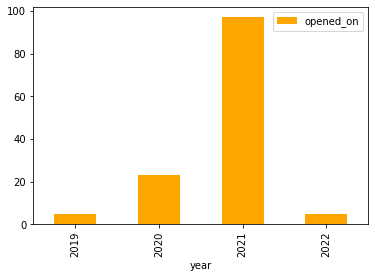

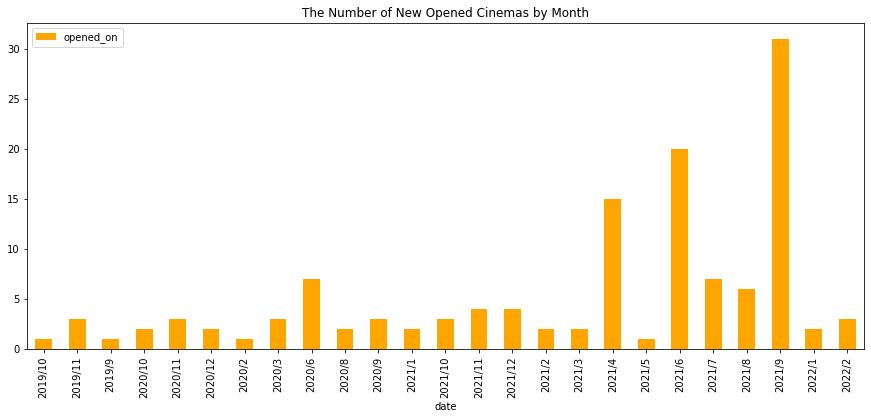

In [22]:
groupedpl1_1 =pl1[['year','opened_on']].groupby(['year']).count()
groupedpl1_1.plot(kind='bar',color='orange')
plt.xlabel("year")
groupedpl1_2 =pl1[['date','opened_on']].groupby(['date']).count()
groupedpl1_2.plot(kind='bar',color='orange',title='The Number of New Opened Cinemas by Month',figsize=(15,6))
plt.xlabel("date")

Text(0.5, 0, 'date')

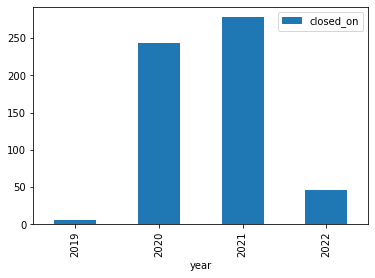

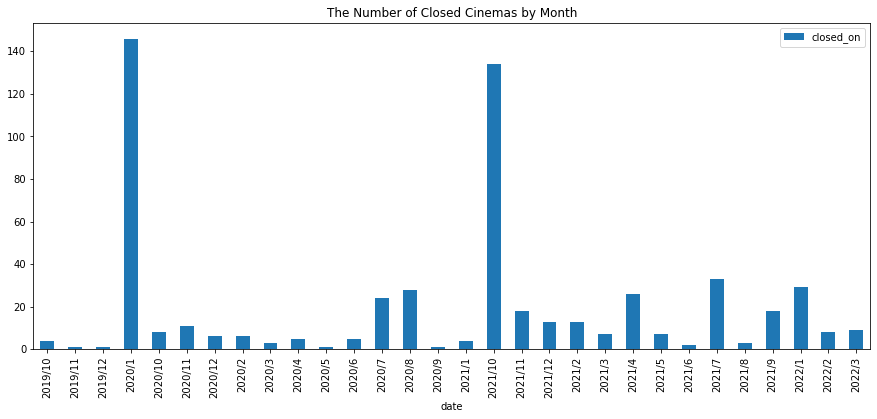

In [23]:
groupedpl2_1 =pl2[['year','closed_on']].groupby(['year']).count()
groupedpl2_1.plot(kind='bar')
plt.xlabel("year")
groupedpl2_2 =pl2[['date','closed_on']].groupby(['date']).count()
groupedpl2_2.plot(kind='bar',title='The Number of Closed Cinemas by Month',figsize=(15,6))
plt.xlabel("date")

In [24]:
import plotly.express as px
fig5=px.bar(groupedpl2_2,title='The Number of Closed Cinemas by Month')
fig5.show()

In [25]:
print(plotly.offline.plot(fig5,include_plotlyjs=False,output_type="div"))

<div>                            <div id="8c802a58-ebee-4182-b850-8516efd44ae9" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("8c802a58-ebee-4182-b850-8516efd44ae9")) {                    Plotly.newPlot(                        "8c802a58-ebee-4182-b850-8516efd44ae9",                        [{"alignmentgroup":"True","hovertemplate":"variable=closed_on<br>date=%{x}<br>value=%{y}<extra></extra>","legendgroup":"closed_on","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"closed_on","offsetgroup":"closed_on","orientation":"v","showlegend":true,"textposition":"auto","x":["2019/10","2019/11","2019/12","2020/1","2020/10","2020/11","2020/12","2020/2","2020/3","2020/4","2020/5","2020/6","2020/7","2020/8","2020/9","2021/1","2021/10","2021/11","2021/12","2021/2","2021/3","2021/4","2021/5","2

In [26]:
import plotly.express as px
fig7 = px.line(groupedpl2_2, title='The Number of Closed Cinemas by Month')
fig7.show()

In [27]:
import plotly.express as px
fig6=px.bar(groupedpl1_2,title='The Number of New Opened Cinemas by Month')
fig6.show()

In [28]:
print(plotly.offline.plot(fig6,include_plotlyjs=False,output_type="div"))

<div>                            <div id="57d08f49-b7a1-471e-bb93-6c18d85b583b" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("57d08f49-b7a1-471e-bb93-6c18d85b583b")) {                    Plotly.newPlot(                        "57d08f49-b7a1-471e-bb93-6c18d85b583b",                        [{"alignmentgroup":"True","hovertemplate":"variable=opened_on<br>date=%{x}<br>value=%{y}<extra></extra>","legendgroup":"opened_on","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"opened_on","offsetgroup":"opened_on","orientation":"v","showlegend":true,"textposition":"auto","x":["2019/10","2019/11","2019/9","2020/10","2020/11","2020/12","2020/2","2020/3","2020/6","2020/8","2020/9","2021/1","2021/10","2021/11","2021/12","2021/2","2021/3","2021/4","2021/5","2021/6","2021/7","2021/8","2021/9","20

In [29]:
import plotly.express as px
fig8 = px.line(groupedpl1_2, title='The Number of New Opened Cinemas by Month')
fig8.show()

In [30]:
groupedplcompare1=pd.merge(groupedpl1_1,groupedpl2_1,how='outer',left_on='year',right_on='year')
groupedplcompare2=pd.merge(groupedpl1_2,groupedpl2_2,how='outer',left_on=['date'],right_on=['date'])

In [31]:
import plotly.express as px
fig1=px.bar(groupedplcompare1,title='Number Change of Opened and Closed Cinemas by Year')
fig1.show()

In [32]:
import plotly

In [33]:
print(plotly.offline.plot(fig1,include_plotlyjs=False,output_type="div"))

<div>                            <div id="a1a774ab-36c3-46d9-ad54-aa02e522ba0f" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("a1a774ab-36c3-46d9-ad54-aa02e522ba0f")) {                    Plotly.newPlot(                        "a1a774ab-36c3-46d9-ad54-aa02e522ba0f",                        [{"alignmentgroup":"True","hovertemplate":"variable=opened_on<br>year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"opened_on","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"opened_on","offsetgroup":"opened_on","orientation":"v","showlegend":true,"textposition":"auto","x":["2019","2020","2021","2022"],"xaxis":"x","y":[5,23,97,5],"yaxis":"y","type":"bar"},{"alignmentgroup":"True","hovertemplate":"variable=closed_on<br>year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"closed_on","mark

In [34]:
import plotly.express as px
fig2 = px.line(groupedplcompare1, title='Number Change of Opened and Closed Cinemas by Year')
fig2.show()

In [35]:
print(plotly.offline.plot(fig2,include_plotlyjs=False,output_type="div"))

<div>                            <div id="aac143bd-6909-4cdd-9bb2-21c23e0f55d2" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("aac143bd-6909-4cdd-9bb2-21c23e0f55d2")) {                    Plotly.newPlot(                        "aac143bd-6909-4cdd-9bb2-21c23e0f55d2",                        [{"hovertemplate":"variable=opened_on<br>year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"opened_on","line":{"color":"#636efa","dash":"solid"},"marker":{"symbol":"circle"},"mode":"lines","name":"opened_on","orientation":"v","showlegend":true,"x":["2019","2020","2021","2022"],"xaxis":"x","y":[5,23,97,5],"yaxis":"y","type":"scatter"},{"hovertemplate":"variable=closed_on<br>year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"closed_on","line":{"color":"#EF553B","dash":"solid"},"marker":{"symbol":"c

In [36]:
import plotly.express as px
fig3 = px.line(groupedplcompare2, title='Number Change of Opened and Closed Cinemas by Month')
fig3.show()

In [37]:
print(plotly.offline.plot(fig3,include_plotlyjs=False,output_type="div"))

<div>                            <div id="69b283de-b9dc-4fa3-9ee4-fcad25c9c842" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("69b283de-b9dc-4fa3-9ee4-fcad25c9c842")) {                    Plotly.newPlot(                        "69b283de-b9dc-4fa3-9ee4-fcad25c9c842",                        [{"hovertemplate":"variable=opened_on<br>date=%{x}<br>value=%{y}<extra></extra>","legendgroup":"opened_on","line":{"color":"#636efa","dash":"solid"},"marker":{"symbol":"circle"},"mode":"lines","name":"opened_on","orientation":"v","showlegend":true,"x":["2019/10","2019/11","2019/9","2020/10","2020/11","2020/12","2020/2","2020/3","2020/6","2020/8","2020/9","2021/1","2021/10","2021/11","2021/12","2021/2","2021/3","2021/4","2021/5","2021/6","2021/7","2021/8","2021/9","2022/1","2022/2","2019/12","2020/1","202

In [38]:
import plotly.express as px
fig4=px.bar(groupedplcompare2,title='Number Change of Opened and Closed Cinemas by Month')
fig4.show()

In [39]:
print(plotly.offline.plot(fig4,include_plotlyjs=False,output_type="div"))

<div>                            <div id="41beb29f-3a1e-482c-9c50-fe89e3a7d396" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("41beb29f-3a1e-482c-9c50-fe89e3a7d396")) {                    Plotly.newPlot(                        "41beb29f-3a1e-482c-9c50-fe89e3a7d396",                        [{"alignmentgroup":"True","hovertemplate":"variable=opened_on<br>date=%{x}<br>value=%{y}<extra></extra>","legendgroup":"opened_on","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"opened_on","offsetgroup":"opened_on","orientation":"v","showlegend":true,"textposition":"auto","x":["2019/10","2019/11","2019/9","2020/10","2020/11","2020/12","2020/2","2020/3","2020/6","2020/8","2020/9","2021/1","2021/10","2021/11","2021/12","2021/2","2021/3","2021/4","2021/5","2021/6","2021/7","2021/8","2021/9","20

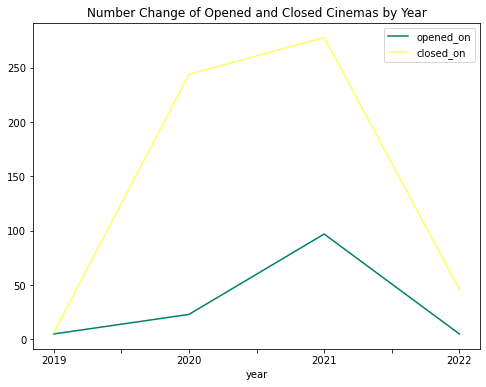

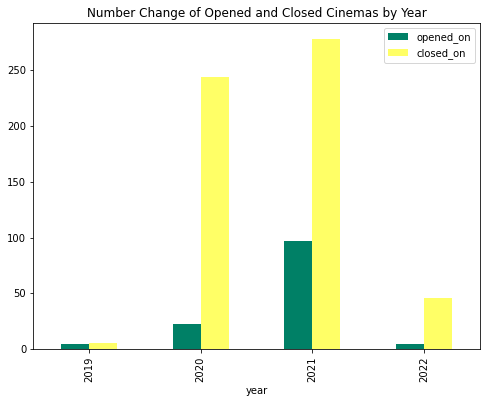

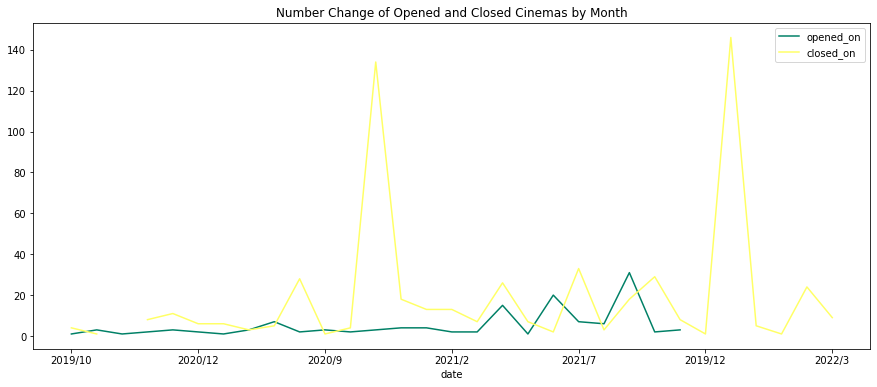

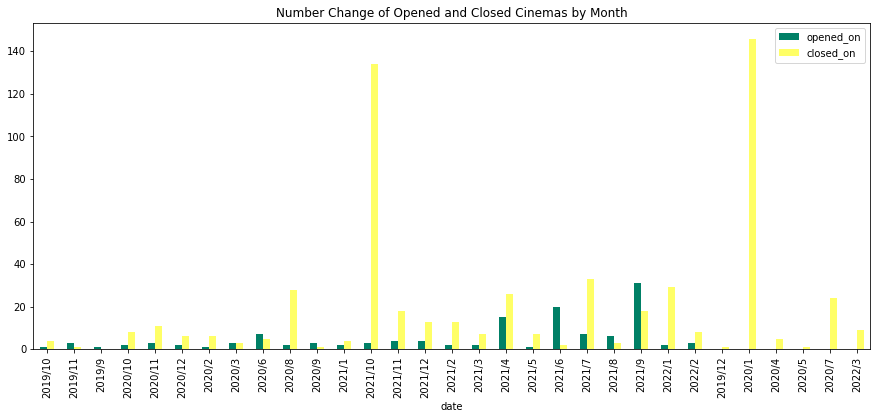

In [41]:
fig1=groupedplcompare1.plot(figsize=(8,6),cmap='summer',title='Number Change of Opened and Closed Cinemas by Year')
fig2=groupedplcompare1.plot(figsize=(8,6),cmap='summer',kind='bar',title='Number Change of Opened and Closed Cinemas by Year')
groupedplcompare2=pd.merge(groupedpl1_2,groupedpl2_2,how='outer',left_on=['date'],right_on=['date'])
fig3=groupedplcompare2.plot(figsize=(15,6),cmap='summer',title='Number Change of Opened and Closed Cinemas by Month')
fig4=groupedplcompare2.plot(kind='bar',cmap='summer',figsize=(15,6),title='Number Change of Opened and Closed Cinemas by Month')

In [42]:
place_us = pd.read_csv('data/place_us.csv')
place_us=place_us[place_us['region'].notnull()]
place_us=place_us[place_us['region']!='HI']
place_us=place_us[place_us['region']!='AS']
pl_us1=place_us[place_us['opened_on'].notnull()]
pl_us2=place_us[place_us['closed_on'].notnull()]

In [43]:
geometry = [Point(xy) for xy in zip(pl_us1.longitude, pl_us1.latitude)]
geopl_us1 = gpd.GeoDataFrame(pl_us1, crs='epsg:4326', geometry=geometry)
geometry = [Point(xy) for xy in zip(pl_us2.longitude, pl_us2.latitude)]
geopl_us2 = gpd.GeoDataFrame(pl_us2, crs='epsg:4326', geometry=geometry)

<AxesSubplot:>

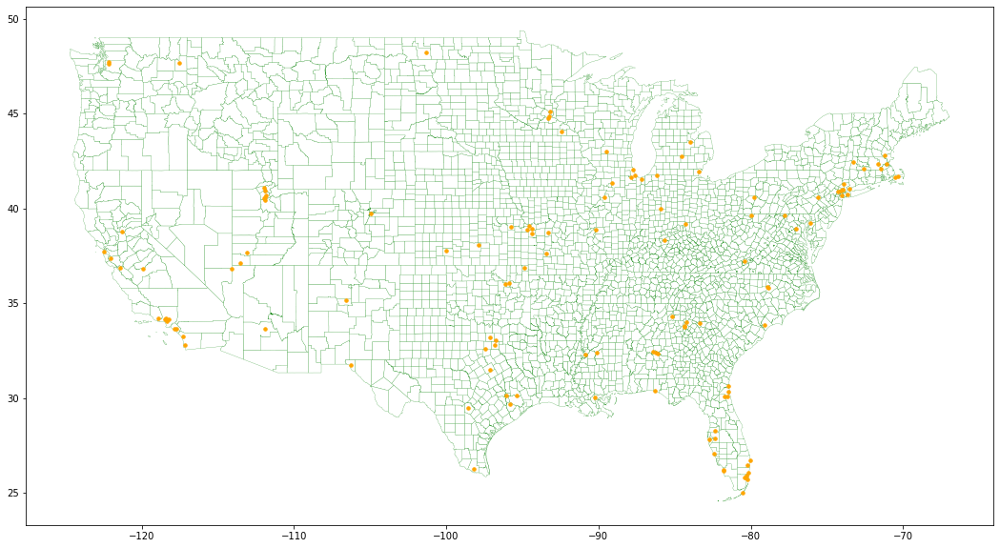

In [44]:
mapus=gpd.read_file('data/map.geojson')
fig, ax = plt.subplots(figsize=(25,10))
mapus.plot(color='white', edgecolor='green', linewidth=.2, ax=ax)
geopl_us1.plot(color='orange',markersize=12, ax=ax)

<AxesSubplot:>

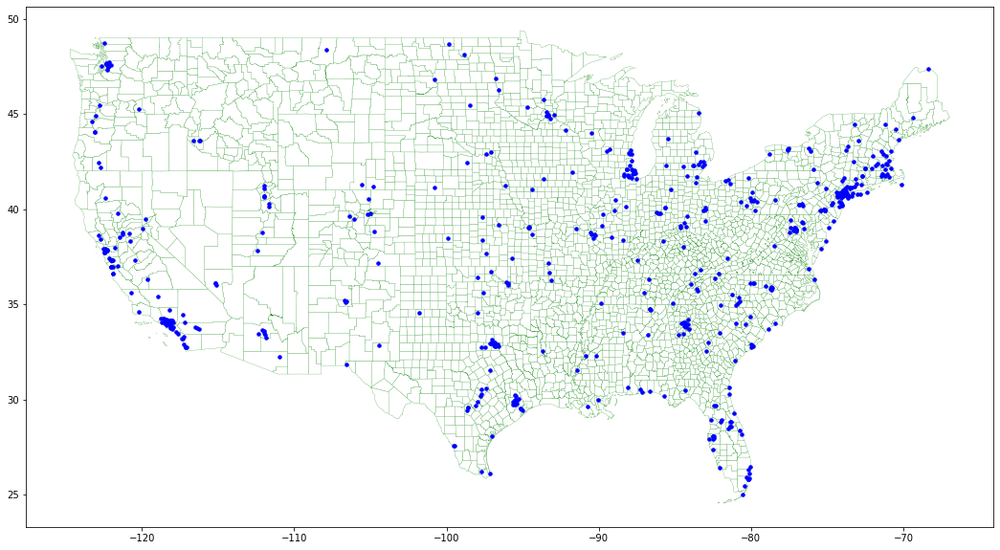

In [45]:
mapus=gpd.read_file('data/map.geojson')
fig, ax = plt.subplots(figsize=(25,10))
mapus.plot(color='white', edgecolor='green', linewidth=.2, ax=ax)
geopl_us2.plot(color='blue',markersize=12, ax=ax)

In [46]:
endpoint_url = "https://data.cdc.gov/resource/3nnm-4jni.json"
response = requests.get(endpoint_url)
data = json.loads(response.text)
mapus['fips']= mapus['STATE'].str[-2:] + mapus['COUNTY'].str[-3:]
covid_us = pd.read_csv('data/United_States_COVID-19_Community_Levels_by_County.csv')
covid_us=pd.DataFrame.from_records(data, columns=['county_fips','county', 'state','covid_hospital_admissions_per_100k','covid_19_community_level'])
mapus['name']=mapus['NAME']+' ' + mapus['LSAD']
mapus.head()

,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry,fips,name
0,0500000US01029,01,029,Cleburne,County,560.100,"POLYGON ((-85.38872 33.91304, -85.38089 33.873...",01029,Cleburne County
1,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County
2,0500000US01037,01,037,Coosa,County,650.926,"POLYGON ((-86.00928 33.10164, -86.00917 33.090...",01037,Coosa County
3,0500000US01039,01,039,Covington,County,1030.456,"POLYGON ((-86.34851 30.99434, -86.35023 30.994...",01039,Covington County
4,0500000US01041,01,041,Crenshaw,County,608.840,"POLYGON ((-86.14699 31.68045, -86.14711 31.663...",01041,Crenshaw County


<AxesSubplot:>

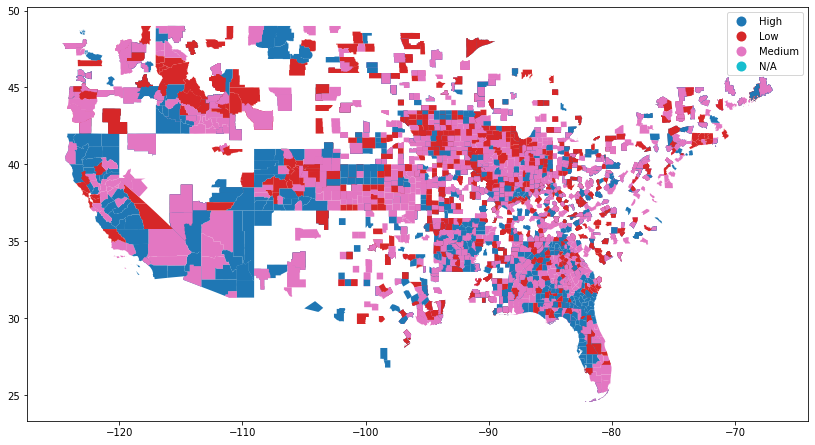

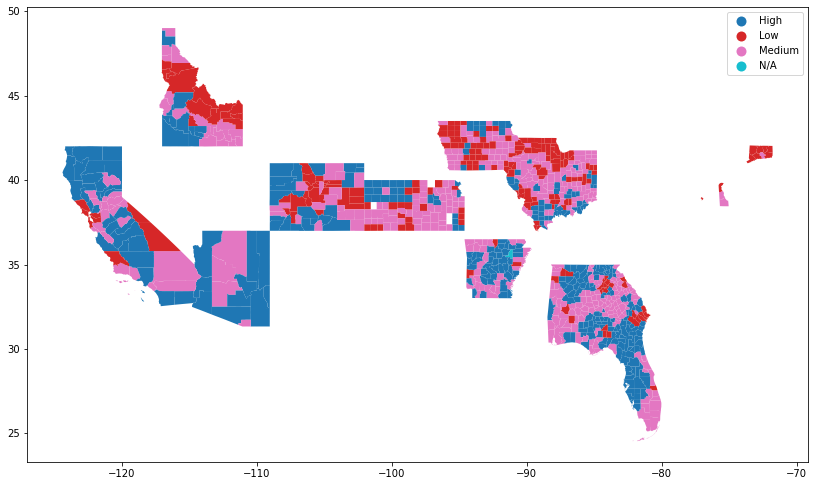

In [47]:
mergedmapus_1 = pd.merge(mapus,covid_us,how='outer',left_on='name',right_on='county')
mergedmapus_1=mergedmapus_1[mergedmapus_1['covid_19_community_level'].notnull()]
mergedmapus_1.plot(column='covid_19_community_level', figsize=(14,10), legend=True)
mergedmapus_2 = pd.merge(mapus,covid_us,how='outer',left_on='fips',right_on='county_fips')
mergedmapus_2.plot(column='covid_19_community_level', figsize=(14,10), legend=True)

Text(0.5, 1.0, 'The relationship between Community Covid Level and the New Opened Cinemas')

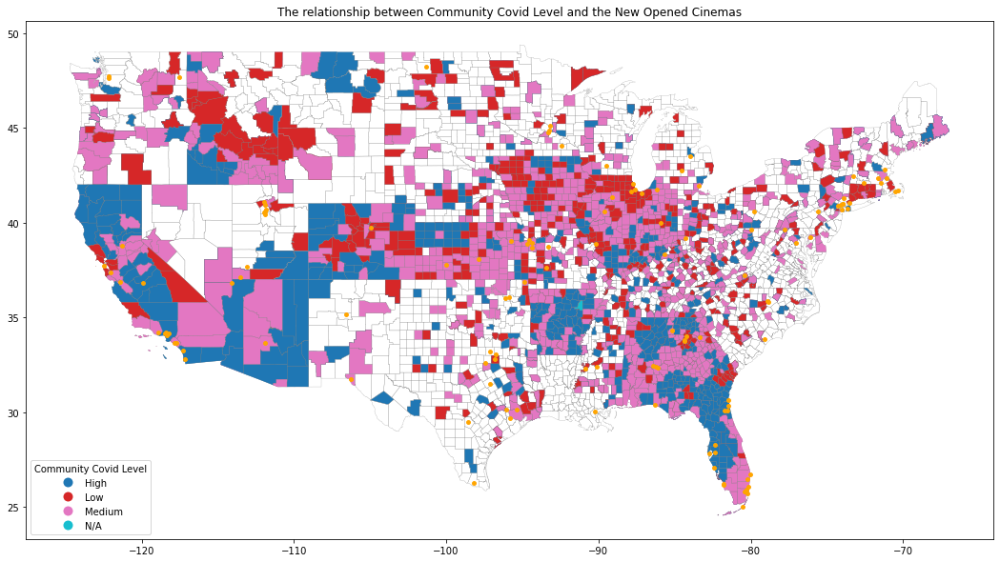

In [48]:
fig5, ax = plt.subplots(figsize=(25,10))
mergedmapus_1.plot(column='covid_19_community_level', figsize=(14,10), legend=True,legend_kwds={'title': 'Community Covid Level','loc':'lower left'},ax=ax)
mergedmapus_2.plot(column='covid_19_community_level', figsize=(14,10), legend=True,legend_kwds={'title': 'Community Covid Level','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='gray', linewidth=.2, ax=ax)
geopl_us1.plot(color='orange',markersize=15, ax=ax)
ax.set_title('The relationship between Community Covid Level and the New Opened Cinemas')

Text(0.5, 1.0, 'The relationship between Community Covid Level and the Closed Cinemas')

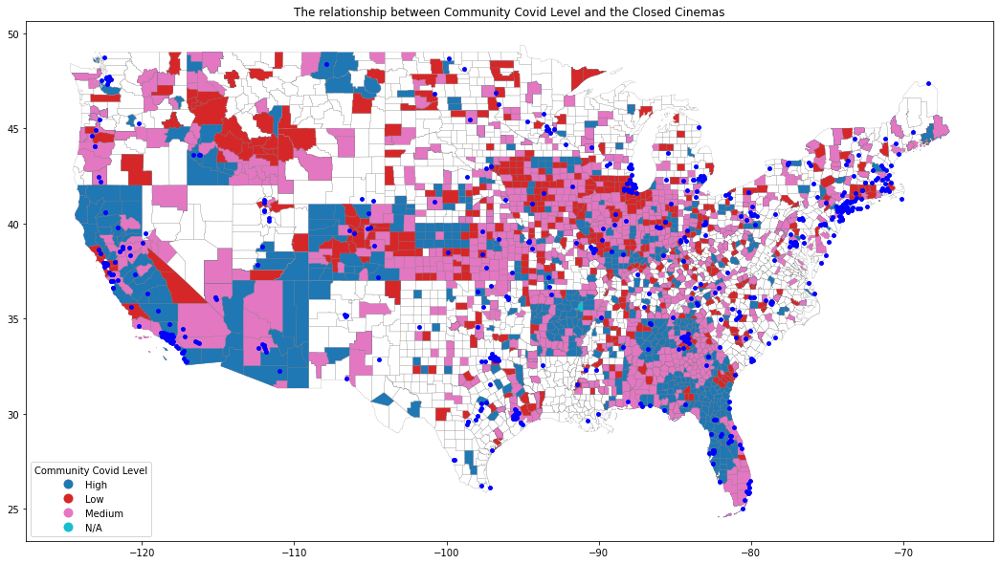

In [49]:
fig, ax = plt.subplots(figsize=(25,10))
mergedmapus_1.plot(column='covid_19_community_level', figsize=(14,10), legend=True,legend_kwds={'title': 'Community Covid Level','loc':'lower left'},ax=ax)
mergedmapus_2.plot(column='covid_19_community_level', figsize=(14,10), legend=True,legend_kwds={'title': 'Community Covid Level','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='gray', linewidth=.2, ax=ax)
geopl_us2.plot(color='blue',markersize=15, ax=ax)
ax.set_title('The relationship between Community Covid Level and the Closed Cinemas')

In [50]:
place_sf = pd.read_csv('data/place_bay.csv')
pl_sf1=place_sf[place_sf['opened_on'].notnull()]
pl_sf2=place_sf[place_sf['closed_on'].notnull()]

In [51]:
mapsf = gpd.read_file('data/Bay Area Counties.geojson')

In [52]:
geometry = [Point(xy) for xy in zip(pl_sf1.longitude, pl_sf1.latitude)]
geopl_sf1 = gpd.GeoDataFrame(pl_sf1, crs='epsg:4326', geometry=geometry)

<AxesSubplot:>

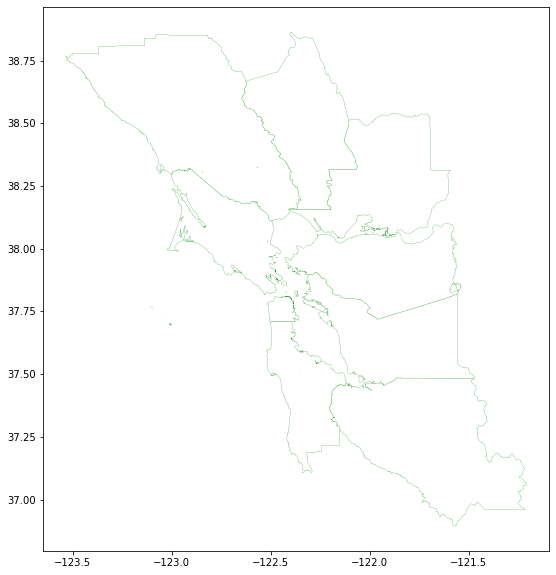

In [53]:
fig, ax = plt.subplots(figsize=(25,10))
mapsf.plot(color='white', edgecolor='green', linewidth=.2, ax=ax)

In [54]:
geometry = [Point(xy) for xy in zip(pl_sf2.longitude, pl_sf2.latitude)]
geopl_sf2 = gpd.GeoDataFrame(pl_sf2, crs='epsg:4326', geometry=geometry)

<AxesSubplot:>

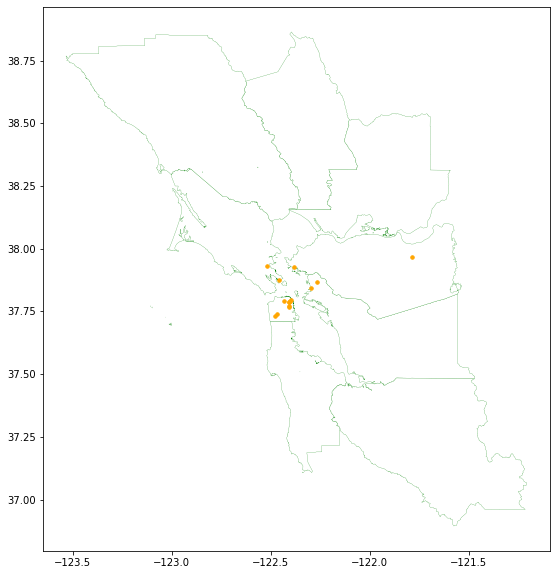

In [55]:
fig, ax = plt.subplots(figsize=(18,10))
mapsf.plot(color='white', edgecolor='green', linewidth=.2, ax=ax)
geopl_sf2.plot(color='orange',markersize=12, ax=ax)

In [56]:
endpoint_url = "https://data.cdc.gov/resource/3nnm-4jni.json"
response = requests.get(endpoint_url)
data = json.loads(response.text)
covid_us=pd.DataFrame.from_records(data, columns=['county_fips','county', 'state','covid_hospital_admissions_per_100k','covid_19_community_level'])
covid_ca=covid_us[(covid_us['state']=='California')]
covid_bay=covid_ca[covid_ca.county.isin(['Alameda County','Napa County','Santa Clara County','Contra Costa County','San Francisco County','Solano County','Marin County','San Mateo County','Sonoma County'])]
covid_bay

,county_fips,county,state,covid_hospital_admissions_per_100k,covid_19_community_level
198,06001,Alameda County,California,9.1,Low
204,06013,Contra Costa County,California,9.1,Low
218,06041,Marin County,California,7.8,Low
225,06055,Napa County,California,13.2,High
235,06075,San Francisco County,California,7.3,Low
238,06081,San Mateo County,California,7.3,Low
240,06085,Santa Clara County,California,10.8,Medium
245,06095,Solano County,California,13.2,High
246,06097,Sonoma County,California,7.8,Low


<AxesSubplot:>

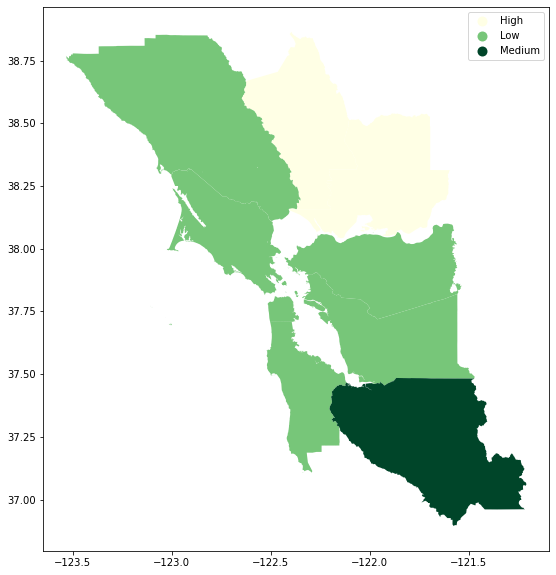

In [57]:
mergedmapsf = pd.merge(mapsf,covid_bay,how='outer',left_on='fipsstco',right_on='county_fips')
mergedmapsf.plot(column='covid_19_community_level',cmap='YlGn', figsize=(14,10), legend=True)

Text(0.5, 1.0, 'The relationship between the Community Covid Level and the Closed Cinemas in Bay Area')

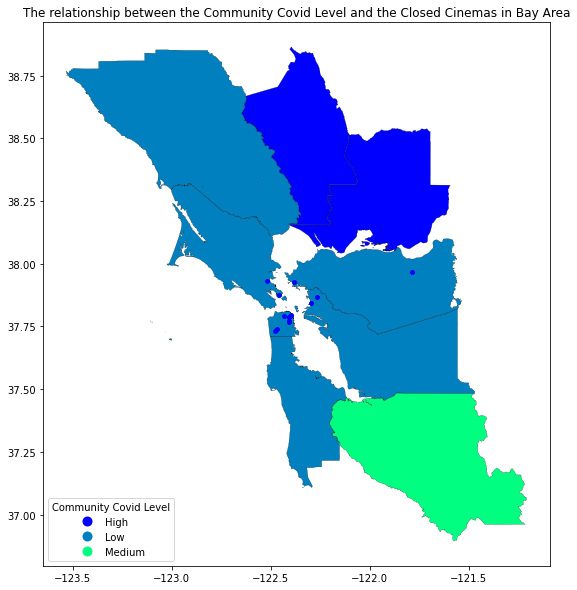

In [58]:
fig, ax = plt.subplots(figsize=(20,10))
mergedmapsf.plot(column='covid_19_community_level',cmap='winter', figsize=(14,10), legend=True, legend_kwds={'title': 'Community Covid Level','loc':'lower left'}, ax=ax)
mapsf.plot(color='none', edgecolor='black', linewidth=.2, ax=ax)
geopl_sf2.plot(color='blue',markersize=15, ax=ax)
ax.set_title('The relationship between the Community Covid Level and the Closed Cinemas in Bay Area')

Text(0.5, 1.0, 'The relationship between the Community Covid Level and the New Opened Cinemas in Bay Area')

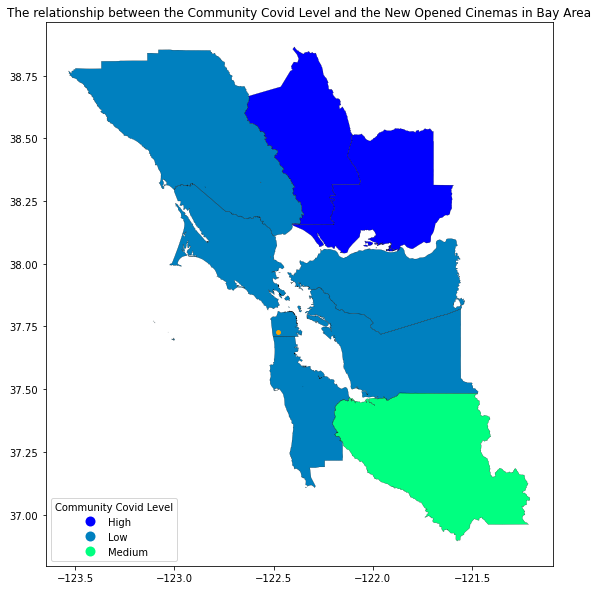

In [59]:
fig, ax = plt.subplots(figsize=(20,10))
mergedmapsf.plot(column='covid_19_community_level',cmap='winter', figsize=(14,10), legend=True,legend_kwds={'title': 'Community Covid Level','loc':'lower left'}, ax=ax)
mapsf.plot(color='none', edgecolor='black', linewidth=.2, ax=ax)
geopl_sf1.plot(color='orange',markersize=15, ax=ax)
ax.set_title('The relationship between the Community Covid Level and the New Opened Cinemas in Bay Area')

<AxesSubplot:title={'center':'Community Covid Level in each County'}, xlabel='county', ylabel='covid_hospital_admissions_per_100k'>

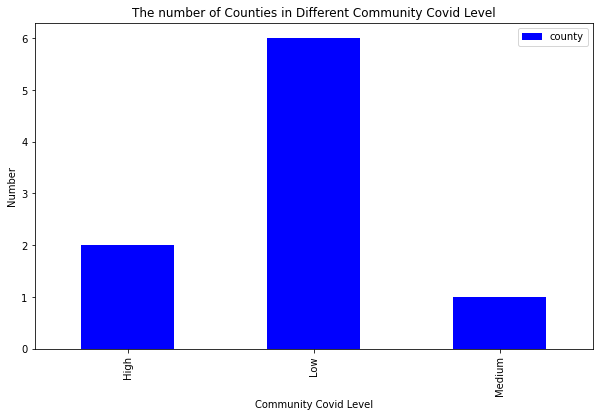

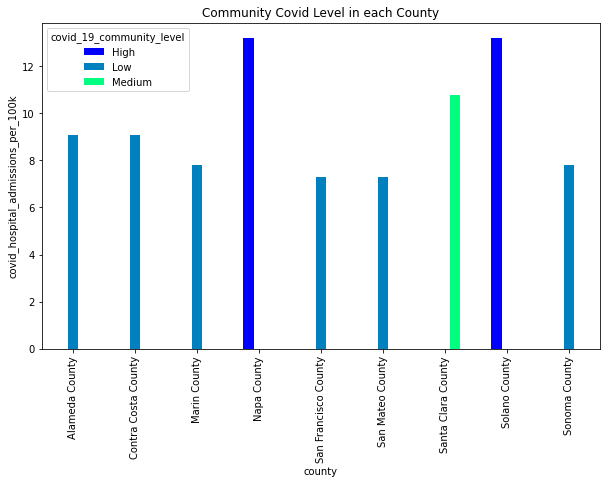

In [60]:
groupedcovid_1=covid_bay[['county','covid_19_community_level']].groupby(['covid_19_community_level']).count()
groupedcovid_1.plot(kind='bar',cmap='winter',figsize=(10,6),title='The number of Counties in Different Community Covid Level',xlabel='Community Covid Level',ylabel='Number')
tablecovid=pd.pivot_table(covid_bay, values='covid_hospital_admissions_per_100k', index='county', columns='covid_19_community_level')
tablecovid.plot(kind ='bar',cmap='winter',figsize=(10,6),title='Community Covid Level in each County',ylabel='covid_hospital_admissions_per_100k')

In [61]:
import plotly.express as px
fig8=px.bar(groupedcovid_1,title='The number of Counties in Different Community Covid Levely')
fig8.show()

In [62]:
print(plotly.offline.plot(fig8,include_plotlyjs=False,output_type="div"))

<div>                            <div id="dd2dfe67-334b-4b5d-b87e-54cc734ee286" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("dd2dfe67-334b-4b5d-b87e-54cc734ee286")) {                    Plotly.newPlot(                        "dd2dfe67-334b-4b5d-b87e-54cc734ee286",                        [{"alignmentgroup":"True","hovertemplate":"variable=county<br>covid_19_community_level=%{x}<br>value=%{y}<extra></extra>","legendgroup":"county","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"county","offsetgroup":"county","orientation":"v","showlegend":true,"textposition":"auto","x":["High","Low","Medium"],"xaxis":"x","y":[2,6,1],"yaxis":"y","type":"bar"}],                        {"barmode":"relative","legend":{"title":{"text":"variable"},"tracegroupgap":0},"template":{"data":{"barpolar":[{

In [63]:
import plotly.express as px
fig9=px.bar(tablecovid,title='Community Covid Level in each County')
fig9.show()

In [64]:
print(plotly.offline.plot(fig9,include_plotlyjs=False,output_type="div"))

<div>                            <div id="2b8c9c46-a4fc-416d-8ada-85c5313ee80c" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("2b8c9c46-a4fc-416d-8ada-85c5313ee80c")) {                    Plotly.newPlot(                        "2b8c9c46-a4fc-416d-8ada-85c5313ee80c",                        [{"alignmentgroup":"True","hovertemplate":"covid_19_community_level=High<br>county=%{x}<br>value=%{y}<extra></extra>","legendgroup":"High","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"High","offsetgroup":"High","orientation":"v","showlegend":true,"textposition":"auto","x":["Alameda County","Contra Costa County","Marin County","Napa County","San Francisco County","San Mateo County","Santa Clara County","Solano County","Sonoma County"],"xaxis":"x","y":[null,null,null,13.2,null,null,null,13.2

In [65]:
popus = pd.read_csv('data/population_data.csv')
popus=pd.DataFrame.from_records(popus, columns=['COUNTY','TOTAL_POPULATION'])
mergedpopus = pd.merge(mapus,popus,how='outer',left_on='name',right_on='COUNTY')
mergedpopus['density']=mergedpopus['TOTAL_POPULATION']/mergedpopus['CENSUSAREA']
mergedpopus=mergedpopus[mergedpopus['density'].notnull()]
mergedpopus.head()

,GEO_ID,STATE,COUNTY_x,NAME,LSAD,CENSUSAREA,geometry,fips,name,COUNTY_y,TOTAL_POPULATION,density
0,0500000US01029,01,029,Cleburne,County,560.100,"POLYGON ((-85.38872 33.91304, -85.38089 33.873...",01029,Cleburne County,Cleburne County,15056.0,26.880914
1,0500000US01029,01,029,Cleburne,County,560.100,"POLYGON ((-85.38872 33.91304, -85.38089 33.873...",01029,Cleburne County,Cleburne County,24711.0,44.118907
2,0500000US05023,05,023,Cleburne,County,553.692,"POLYGON ((-92.24172 35.64293, -92.24165 35.646...",05023,Cleburne County,Cleburne County,15056.0,27.192013
3,0500000US05023,05,023,Cleburne,County,553.692,"POLYGON ((-92.24172 35.64293, -92.24165 35.646...",05023,Cleburne County,Cleburne County,24711.0,44.629505
4,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County,Coffee County,43092.0,63.466535


Text(0.5, 1.0, 'The relationship between the Density of People and the New Opened Cinemas in Bay Area')

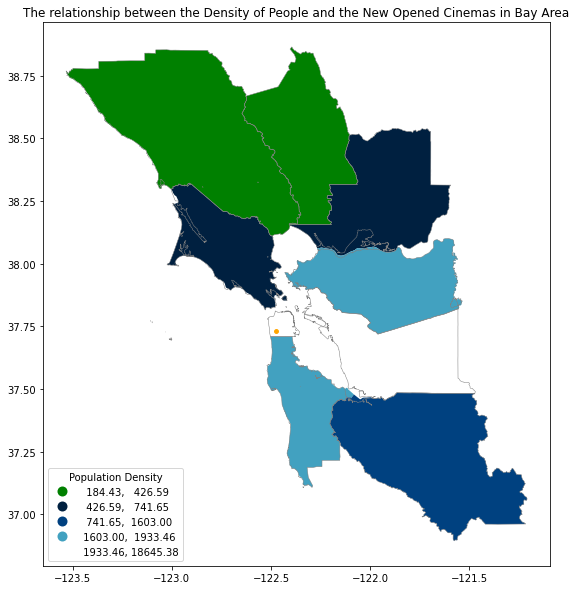

In [66]:
mergedpopbay=mergedpopus[mergedpopus.COUNTY_y.isin(['Alameda County','Napa County','Santa Clara County','Contra Costa County','San Francisco County','Solano County','Marin County','San Mateo County','Sonoma County'])]
fig, ax = plt.subplots(figsize=(20,10))
mergedpopbay.plot(column='density',cmap='ocean',scheme='quantiles',  figsize=(14,10), legend=True,legend_kwds={'title': 'Population Density','loc':'lower left'},ax=ax)
mapsf.plot(color='none', edgecolor='gray', linewidth=.5, ax=ax)
geopl_sf1.plot(color='orange',markersize=15, ax=ax)
ax.set_title('The relationship between the Density of People and the New Opened Cinemas in Bay Area')

Text(0.5, 1.0, 'The relationship between the Density of People and the Closed Cinemas in Bay Area')

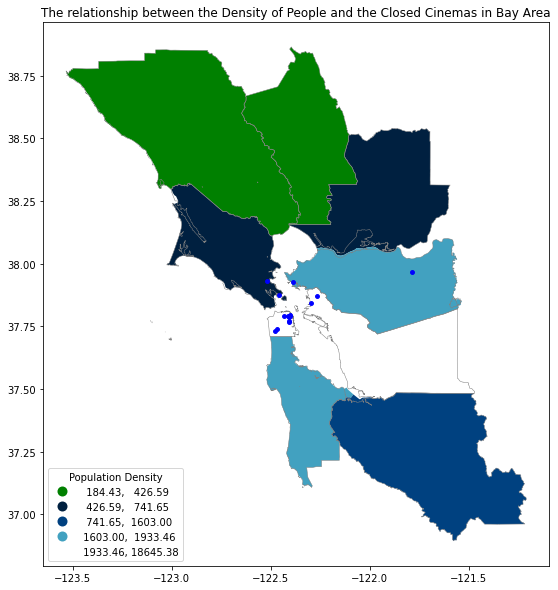

In [67]:
fig, ax = plt.subplots(figsize=(20,10))
mergedpopbay.plot(column='density',cmap='ocean',scheme='quantiles',  figsize=(14,10), legend=True,legend_kwds={'title': 'Population Density','loc':'lower left'},ax=ax)
mapsf.plot(color='none', edgecolor='gray', linewidth=.5, ax=ax)
geopl_sf2.plot(color='blue',markersize=15, ax=ax)
ax.set_title('The relationship between the Density of People and the Closed Cinemas in Bay Area')

<AxesSubplot:>

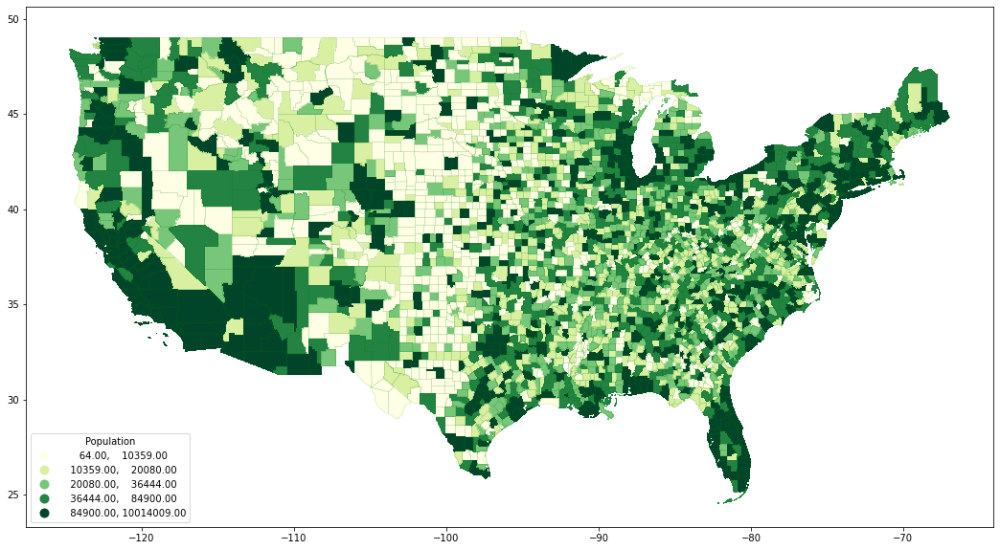

In [68]:
fig, ax = plt.subplots(figsize=(25,10))
mergedpopus.plot(column='TOTAL_POPULATION',cmap='YlGn', figsize=(14,10), scheme='quantiles', legend=True,legend_kwds={'title': 'Population','loc':'lower left'}, antialiased=False,ax=ax)
mapus.plot(color='none', edgecolor='green', linewidth=.1, ax=ax)

Text(0.5, 1.0, 'The relationship between the Density of People in each County and the New Opened Cinemas')

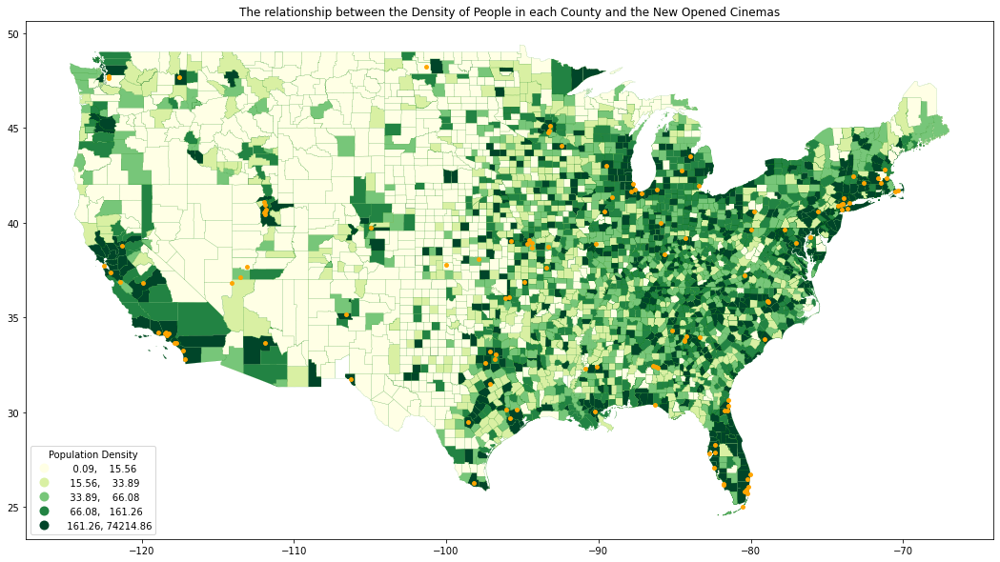

In [69]:
fig, ax = plt.subplots(figsize=(25,10))
mergedpopus.plot(column='density',cmap='YlGn', scheme='quantiles', figsize=(14,10), legend=True,legend_kwds={'title': 'Population Density','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='green', linewidth=.1, ax=ax)
geopl_us1.plot(color='orange',markersize=15,ax=ax)
ax.set_title('The relationship between the Density of People in each County and the New Opened Cinemas')

Text(0.5, 1.0, 'The relationship between the Density of People in each County and the Closed Cinemas')

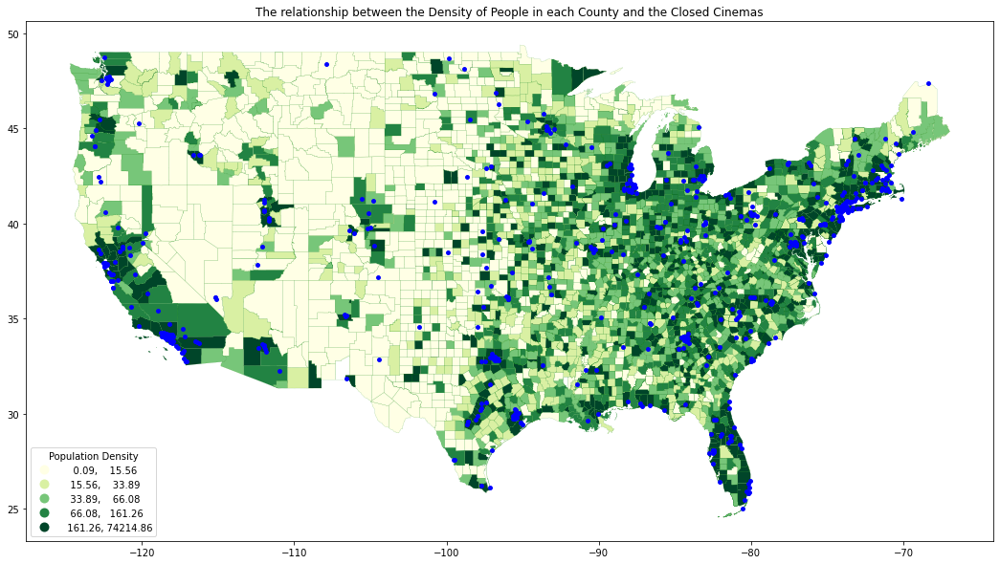

In [70]:
fig, ax = plt.subplots(figsize=(25,10))
mergedpopus.plot(column='density',cmap='YlGn', scheme='quantiles', figsize=(14,10), legend=True,legend_kwds={'title': 'Population Density','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='green', linewidth=.1, ax=ax)
geopl_us2.plot(color='blue',markersize=15, ax=ax)
ax.set_title('The relationship between the Density of People in each County and the Closed Cinemas')

In [71]:
new_covid_data = pd.read_csv('data/COVID_Cases_Restricted_Detailed_12042020.csv')
new_covid_data['number']='1'
new_covid_data['county_fips_code']=new_covid_data['county_fips_code'].astype(str)
new_covid_data['county_fips_code']=new_covid_data['county_fips_code'].str.split('.').str[0]
new_covid_data.head()

,race_ethnicity_combined,current_status,cdc_report_dt,sex,onset_dt,pos_spec_dt,hosp_yn,icu_yn,death_yn,hc_work_yn,...,nauseavomit_yn,headache_yn,abdom_yn,diarrhea_yn,medcond_yn,county_fips_code,res_county,res_state,age_group,number
0,Unknown,Laboratory-confirmed case,2020-09-15,Female,NaN,NaN,Missing,Missing,Missing,Missing,...,Missing,Missing,Missing,Missing,Missing,72005,AGUADILLA,PR,30 - 39 Years,1
1,Unknown,Laboratory-confirmed case,2020-09-27,Female,NaN,NaN,Missing,Missing,Missing,Missing,...,Missing,Missing,Missing,Missing,Missing,72005,AGUADILLA,PR,30 - 39 Years,1
2,Unknown,Laboratory-confirmed case,2020-09-13,Female,NaN,NaN,Missing,Missing,Missing,Missing,...,Missing,Missing,Missing,Missing,Missing,72005,AGUADILLA,PR,30 - 39 Years,1
3,Unknown,Laboratory-confirmed case,2020-07-31,Female,NaN,NaN,Missing,Missing,Missing,Missing,...,Missing,Missing,Missing,Missing,Missing,72005,AGUADILLA,PR,30 - 39 Years,1
4,Unknown,Laboratory-confirmed case,2020-10-01,Female,NaN,NaN,Missing,Missing,Missing,Missing,...,Missing,Missing,Missing,Missing,Missing,72005,AGUADILLA,PR,30 - 39 Years,1


In [72]:
groupcovid=new_covid_data['county_fips_code'].value_counts().rename_axis('county_fips_code').reset_index(name='count')
groupcovid['county_fips_code']=groupcovid['county_fips_code'].astype(str)
groupcovid

,county_fips_code,count
0,nan,312696
1,17031,261674
2,4013,178264
3,12086,158552
4,32003,109281
...,...,...
3113,31075,4
3114,46089,4
3115,22023,3
3116,31117,1


In [73]:
mergedcovidus = pd.merge(mergedmapus_1,groupcovid,how='inner',left_on='county_fips',right_on='county_fips_code')
mergedcovidus =mergedcovidus[mergedcovidus['geometry'].notnull()]
mergedcovidus

,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry,fips,name,county_fips,county,state,covid_hospital_admissions_per_100k,covid_19_community_level,county_fips_code,count
0,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945
1,0500000US13069,13,069,Coffee,County,575.097,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",13069,Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945
2,0500000US47031,47,031,Coffee,County,428.957,"POLYGON ((-86.02797 35.34384, -86.03499 35.344...",47031,Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945
3,0500000US01049,01,049,DeKalb,County,777.093,"POLYGON ((-85.57593 34.82373, -85.56142 34.750...",01049,DeKalb County,13089,DeKalb County,Georgia,9.7,Low,13089,16295
4,0500000US13089,13,089,DeKalb,County,267.582,"POLYGON ((-84.07097 33.77503, -84.06900 33.774...",13089,DeKalb County,13089,DeKalb County,Georgia,9.7,Low,13089,16295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3802,0500000US20191,20,191,Sumner,County,1181.941,"POLYGON ((-97.69218 36.99885, -97.69710 36.998...",20191,Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637
3803,0500000US47165,47,165,Sumner,County,529.449,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",47165,Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637
3804,0500000US20195,20,195,Trego,County,889.478,"POLYGON ((-99.59592 38.82693, -99.59673 38.781...",20195,Trego County,20195,Trego County,Kansas,36.2,High,20195,180
3805,0500000US20197,20,197,Wabaunsee,County,794.302,"POLYGON ((-95.94659 38.86997, -95.94638 38.804...",20197,Wabaunsee County,20197,Wabaunsee County,Kansas,18.3,Medium,20197,267


Text(0.5, 1.0, 'The relationship between the number of People who have Covid-19 and the Closed Cinemas')

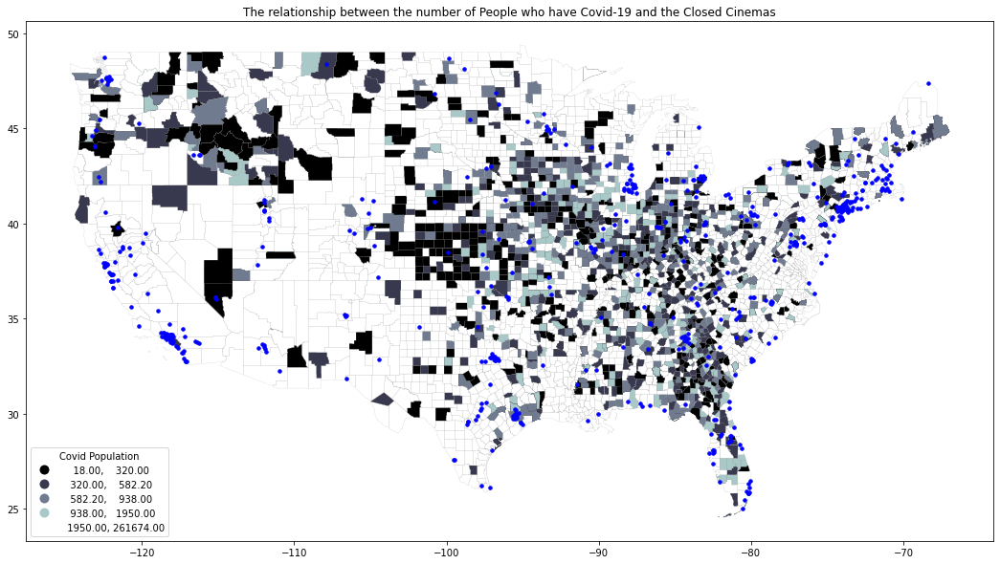

In [74]:
fig, ax = plt.subplots(figsize=(25,10))
mergedcovidus.plot(column='count',cmap='bone', scheme='quantiles', figsize=(14,10), legend=True,legend_kwds={'title': 'Covid Population','loc':'lower left'}, ax=ax)
mapus.plot(color='none', edgecolor='grey', linewidth=.1, ax=ax)
geopl_us2.plot(color='blue',markersize=12, ax=ax)
ax.set_title('The relationship between the number of People who have Covid-19 and the Closed Cinemas')

Text(0.5, 1.0, 'The relationship between the number of People who have Covid-19 and the New Opend Cinemas')

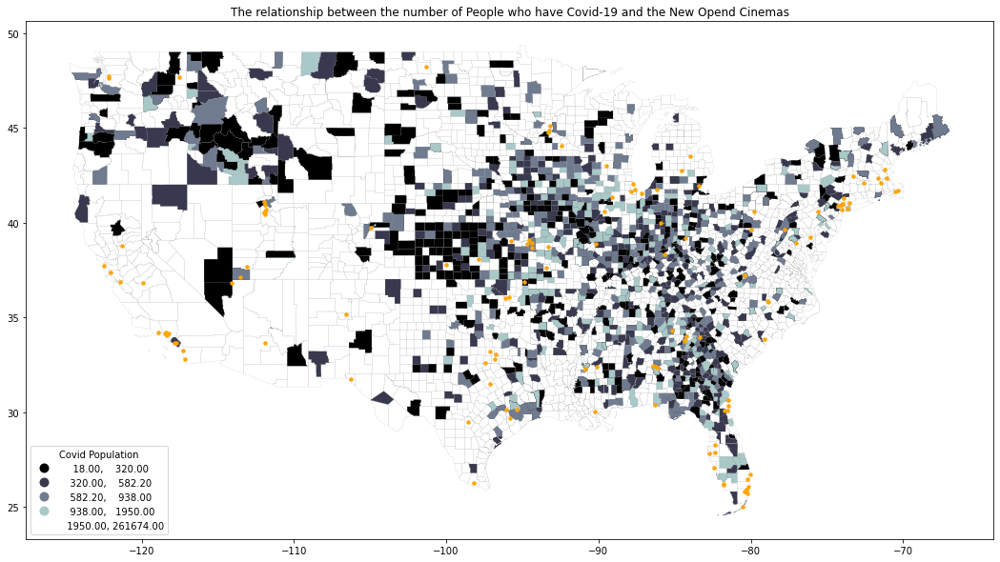

In [75]:
fig, ax = plt.subplots(figsize=(25,10))
mergedcovidus.plot(column='count',cmap='bone', scheme='quantiles', figsize=(14,10), legend=True, legend_kwds={'title': 'Covid Population','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='grey', linewidth=.1, ax=ax)
geopl_us1.plot(color='orange',markersize=12, ax=ax)
ax.set_title('The relationship between the number of People who have Covid-19 and the New Opend Cinemas')

In [76]:
mergedpopus.head()
mergedcoviddens=pd.merge(mergedpopus,mergedcovidus,how='inner',left_on='fips',right_on='fips')
mergedcoviddens['covid_density']=mergedcoviddens['count']/mergedcoviddens['TOTAL_POPULATION']
mergedcoviddens

,GEO_ID_x,STATE_x,COUNTY_x,NAME_x,LSAD_x,CENSUSAREA_x,geometry_x,fips,name_x,COUNTY_y,...,geometry_y,name_y,county_fips,county,state,covid_hospital_admissions_per_100k,covid_19_community_level,county_fips_code,count,covid_density
0,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County,Coffee County,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.045136
1,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County,Coffee County,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.036379
2,0500000US01031,01,031,Coffee,County,678.972,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",01031,Coffee County,Coffee County,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.033599
3,0500000US13069,13,069,Coffee,County,575.097,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",13069,Coffee County,Coffee County,...,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.045136
4,0500000US13069,13,069,Coffee,County,575.097,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",13069,Coffee County,Coffee County,...,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.036379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48406,0500000US47165,47,165,Sumner,County,529.449,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",47165,Sumner County,Sumner County,...,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637,0.028460
48407,0500000US47165,47,165,Sumner,County,529.449,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",47165,Sumner County,Sumner County,...,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637,0.003245
48408,0500000US20195,20,195,Trego,County,889.478,"POLYGON ((-99.59592 38.82693, -99.59673 38.781...",20195,Trego County,Trego County,...,"POLYGON ((-99.59592 38.82693, -99.59673 38.781...",Trego County,20195,Trego County,Kansas,36.2,High,20195,180,0.064103
48409,0500000US20197,20,197,Wabaunsee,County,794.302,"POLYGON ((-95.94659 38.86997, -95.94638 38.804...",20197,Wabaunsee County,Wabaunsee County,...,"POLYGON ((-95.94659 38.86997, -95.94638 38.804...",Wabaunsee County,20197,Wabaunsee County,Kansas,18.3,Medium,20197,267,0.038825


In [77]:
coviddens=mergedcoviddens.drop(labels='geometry_x',axis=1, index=None, columns=None, inplace=False)
coviddens.rename(columns={'geometry_y':'geometry'},inplace=True)
coviddens

,GEO_ID_x,STATE_x,COUNTY_x,NAME_x,LSAD_x,CENSUSAREA_x,fips,name_x,COUNTY_y,TOTAL_POPULATION,...,geometry,name_y,county_fips,county,state,covid_hospital_admissions_per_100k,covid_19_community_level,county_fips_code,count,covid_density
0,0500000US01031,01,031,Coffee,County,678.972,01031,Coffee County,Coffee County,43092.0,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.045136
1,0500000US01031,01,031,Coffee,County,678.972,01031,Coffee County,Coffee County,53465.0,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.036379
2,0500000US01031,01,031,Coffee,County,678.972,01031,Coffee County,Coffee County,57889.0,...,"POLYGON ((-86.03044 31.61894, -86.00409 31.619...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.033599
3,0500000US13069,13,069,Coffee,County,575.097,13069,Coffee County,Coffee County,43092.0,...,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.045136
4,0500000US13069,13,069,Coffee,County,575.097,13069,Coffee County,Coffee County,53465.0,...,"POLYGON ((-82.81403 31.67142, -82.63185 31.672...",Coffee County,13069,Coffee County,Georgia,25.5,High,13069,1945,0.036379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48406,0500000US47165,47,165,Sumner,County,529.449,47165,Sumner County,Sumner County,22382.0,...,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637,0.028460
48407,0500000US47165,47,165,Sumner,County,529.449,47165,Sumner County,Sumner County,196281.0,...,"POLYGON ((-86.53790 36.64248, -86.50777 36.652...",Sumner County,20191,Sumner County,Kansas,12.8,Medium,20191,637,0.003245
48408,0500000US20195,20,195,Trego,County,889.478,20195,Trego County,Trego County,2808.0,...,"POLYGON ((-99.59592 38.82693, -99.59673 38.781...",Trego County,20195,Trego County,Kansas,36.2,High,20195,180,0.064103
48409,0500000US20197,20,197,Wabaunsee,County,794.302,20197,Wabaunsee County,Wabaunsee County,6877.0,...,"POLYGON ((-95.94659 38.86997, -95.94638 38.804...",Wabaunsee County,20197,Wabaunsee County,Kansas,18.3,Medium,20197,267,0.038825


Text(0.5, 1.0, 'The relationship between the Density of People who have Covid-19 in each County and the Closed Cinemas')

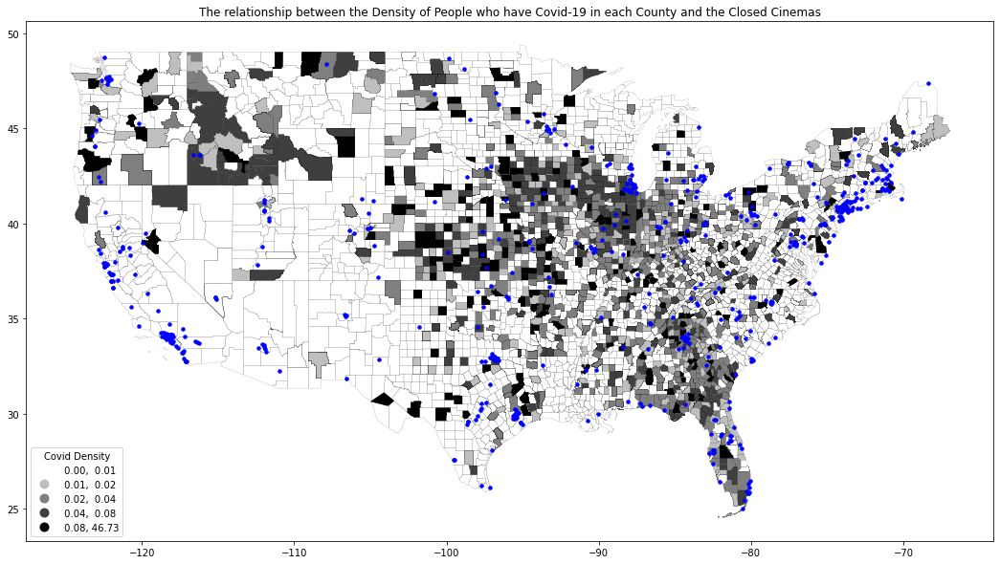

In [78]:
fig, ax = plt.subplots(figsize=(25,10))
coviddens.plot(column='covid_density',cmap="binary", scheme='quantiles', figsize=(14,10), legend=True,legend_kwds={'title': 'Covid Density','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='black', linewidth=.1, ax=ax)
geopl_us2.plot(color='blue',markersize=12, ax=ax)
ax.set_title('The relationship between the Density of People who have Covid-19 in each County and the Closed Cinemas')

Text(0.5, 1.0, 'The relationship between the Density of People who have Covid-19 in each County and the New Opened Cinemas')

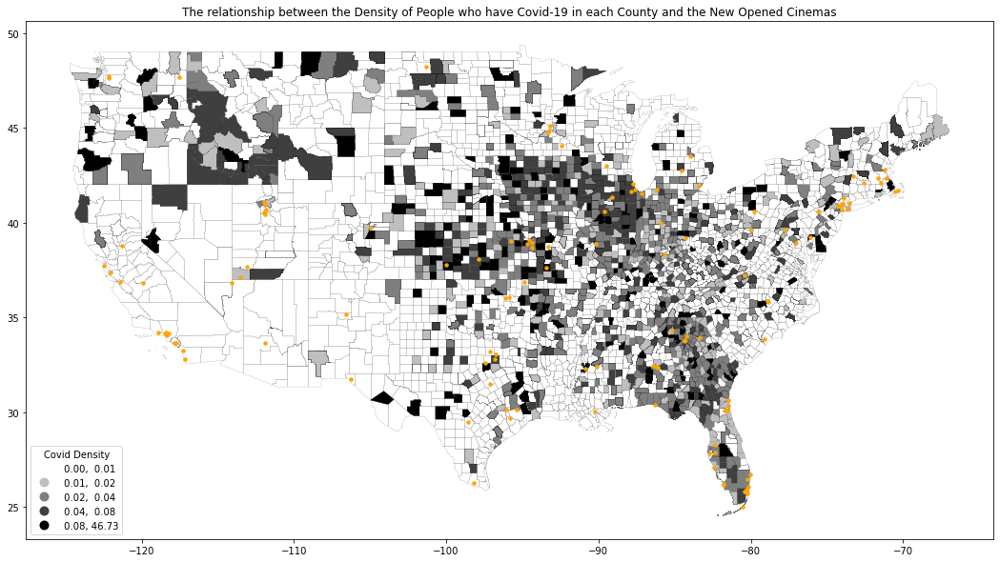

In [79]:
fig, ax = plt.subplots(figsize=(25,10))
coviddens.plot(column='covid_density',cmap="binary", scheme='quantiles', figsize=(14,10), legend=True,legend_kwds={'title': 'Covid Density','loc':'lower left'},ax=ax)
mapus.plot(color='none', edgecolor='black', linewidth=.1, ax=ax)
geopl_us1.plot(color='orange',markersize=12, ax=ax)
ax.set_title('The relationship between the Density of People who have Covid-19 in each County and the New Opened Cinemas')

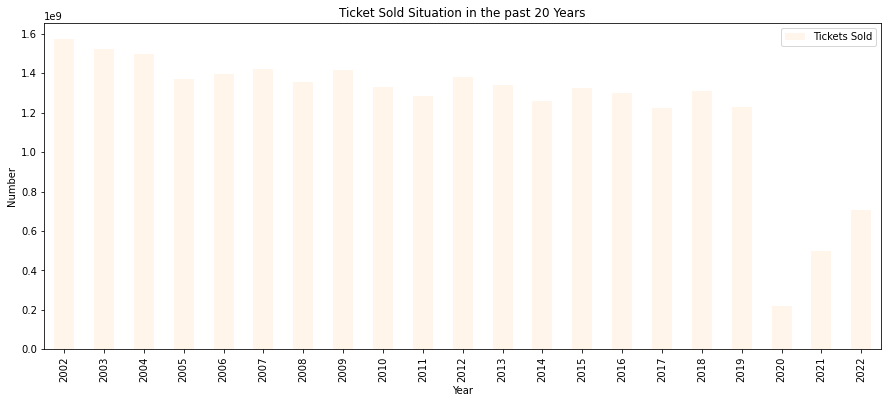

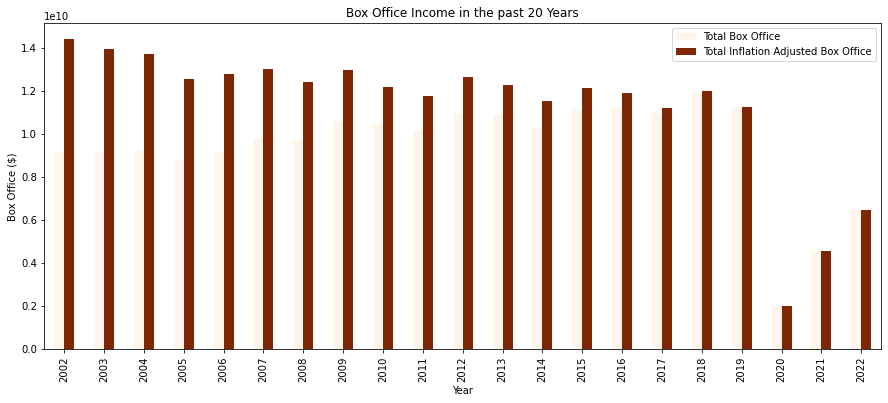

In [80]:
ticket= pd.read_csv('data/ticket_sales.csv')
ticket_sold=ticket[['Year','Tickets Sold']].groupby(['Year']).sum()
ticket_sold.plot(kind='bar',xlabel='Year',ylabel='Number',cmap='Oranges',figsize=(15,6),title='Ticket Sold Situation in the past 20 Years')
ticket_box=ticket[['Year','Total Box Office','Total Inflation Adjusted Box Office']].groupby(['Year']).sum()
fig=ticket_box.plot(kind='bar',xlabel='Year',ylabel='Box Office ($)',cmap='Oranges',figsize=(15,6),title='Box Office Income in the past 20 Years')

In [81]:
import plotly.express as px
fig10=px.bar(ticket_sold,title='Ticket Sold Situation in the past 20 Years')
fig10.show()

In [82]:
print(plotly.offline.plot(fig10,include_plotlyjs=False,output_type="div"))

<div>                            <div id="db05556e-0f32-410d-b07c-4acd860ee547" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("db05556e-0f32-410d-b07c-4acd860ee547")) {                    Plotly.newPlot(                        "db05556e-0f32-410d-b07c-4acd860ee547",                        [{"alignmentgroup":"True","hovertemplate":"variable=Tickets Sold<br>Year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"Tickets Sold","marker":{"color":"#636efa","pattern":{"shape":""}},"name":"Tickets Sold","offsetgroup":"Tickets Sold","orientation":"v","showlegend":true,"textposition":"auto","x":[2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022],"xaxis":"x","y":[1575789488,1524589620,1495651298,1372980280,1398738283,1420036680,1358042073,141856

In [83]:
import plotly.express as px
fig11=px.line(ticket_box,title='Box Office Income in the past 20 Years')
fig11.show()

In [84]:
print(plotly.offline.plot(fig11,include_plotlyjs=False,output_type="div"))

<div>                            <div id="041b6a50-b7a7-4080-a2fb-a18634ad8d1e" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("041b6a50-b7a7-4080-a2fb-a18634ad8d1e")) {                    Plotly.newPlot(                        "041b6a50-b7a7-4080-a2fb-a18634ad8d1e",                        [{"hovertemplate":"variable=Total Box Office<br>Year=%{x}<br>value=%{y}<extra></extra>","legendgroup":"Total Box Office","line":{"color":"#636efa","dash":"solid"},"marker":{"symbol":"circle"},"mode":"lines","name":"Total Box Office","orientation":"v","showlegend":true,"x":[2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022],"xaxis":"x","y":[9155338716,9193277289,9287996519,8800805718,9161738221,9769854914,9750744148,10639257284,10482254025,10173519704

In [85]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    import plotly.express as px
import pandas as pd
df = mergedpopus
fig00 = px.choropleth_mapbox(df, geojson=counties, locations='fips', color='TOTAL_POPULATION',
                           color_continuous_scale="YlGn",
                           range_color=(0, 80000),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           labels={'unemp':'unemployment rate'},
                          )
fig00.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig00.show()

In [86]:
print(plotly.offline.plot(fig00,include_plotlyjs=False,output_type="div"))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

